In [ ]:
#@title Калибровка

In [ ]:
# Подключение Google Диска
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html

In [ ]:
import numpy as np
import cv2 as cv
import glob
from google.colab.patches import cv2_imshow

# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((3*3,3), np.float32)
objp[:,:2] = np.mgrid[0:3,0:3].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob('/content/frame_0081.jpg')

for fname in images:
    img = cv.imread(fname)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv.findChessboardCorners(gray, (3,3), None)

    print (ret)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        cv.drawChessboardCorners(img, (3,3), corners2, ret)
        cv2_imshow(img)
        cv.waitKey(500)

#cv.destroyAllWindows()

False


Для 3x3: True


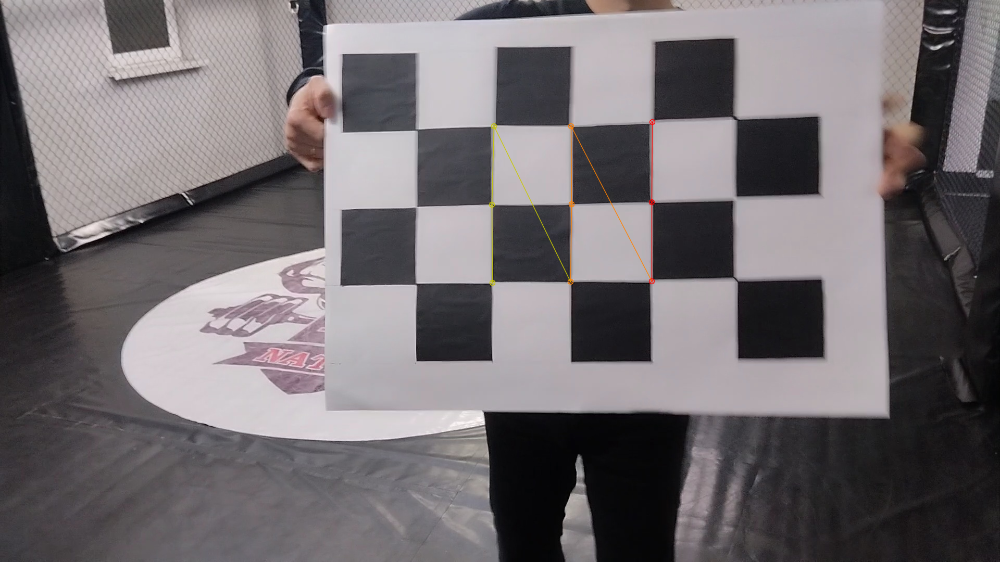

Для 3x4: True


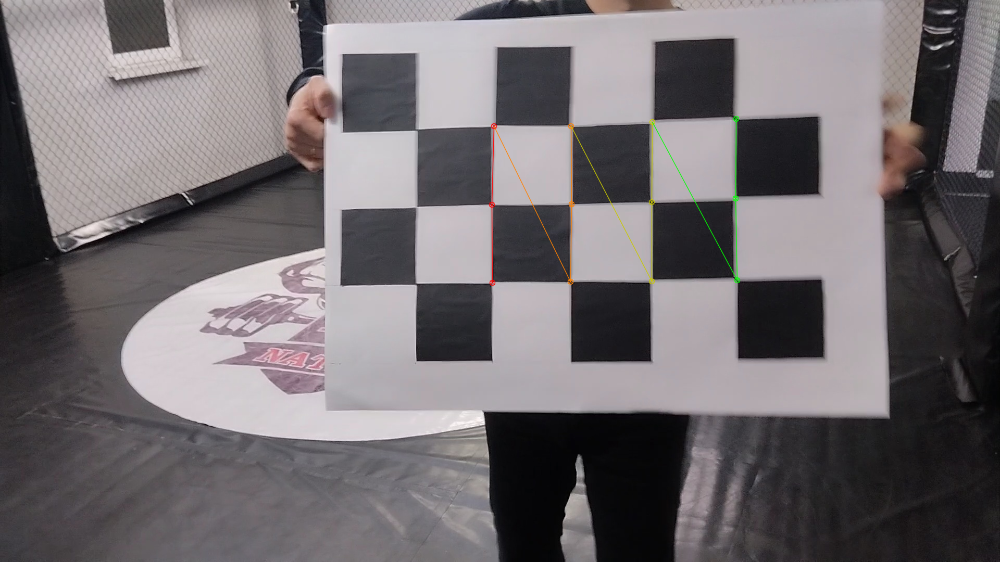

Для 3x5: True


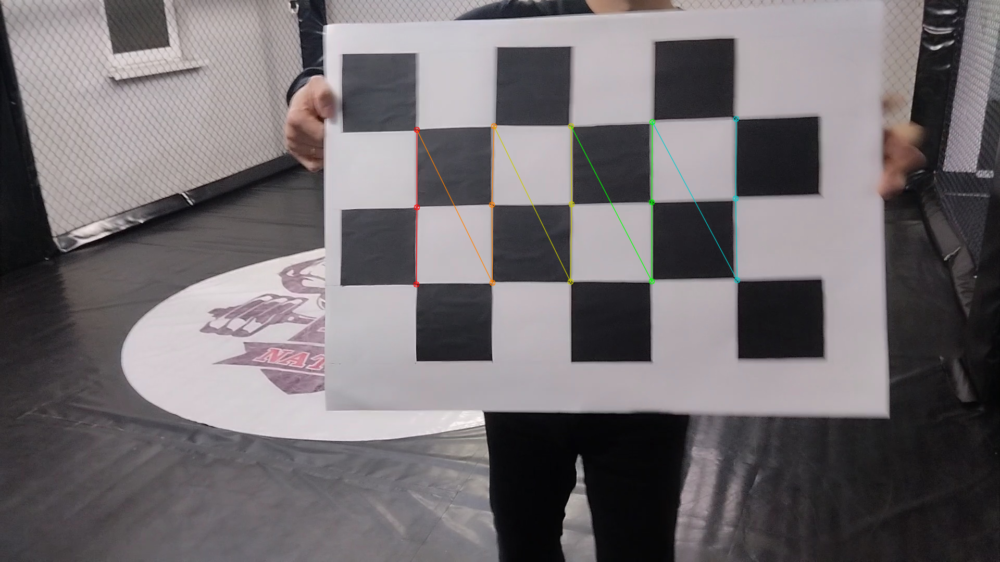

Для 3x6: False
Углы шахматной доски 3x6 не найдены.
Для 3x7: False
Углы шахматной доски 3x7 не найдены.
Для 4x3: True


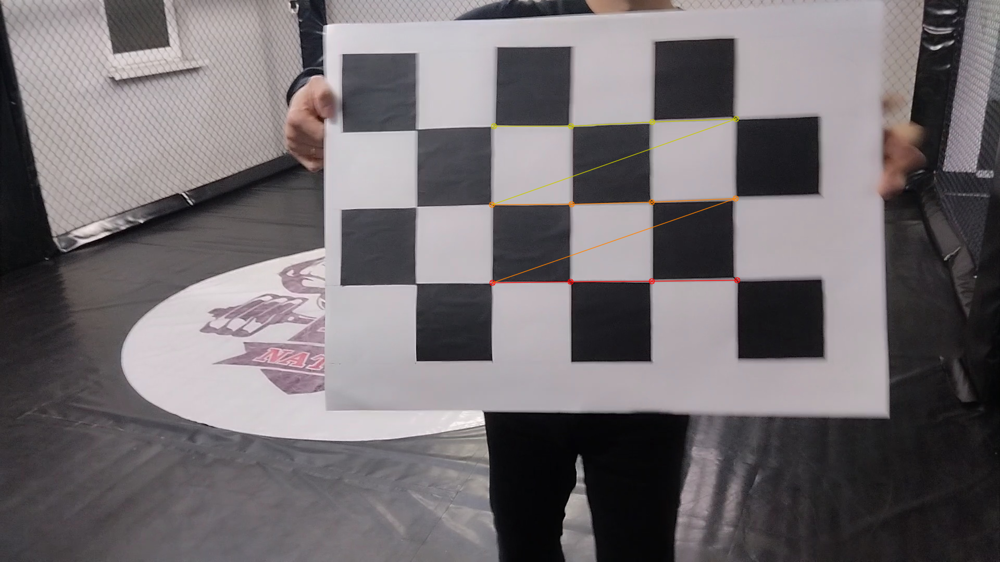

Для 4x4: False
Углы шахматной доски 4x4 не найдены.
Для 4x5: False
Углы шахматной доски 4x5 не найдены.
Для 4x6: False
Углы шахматной доски 4x6 не найдены.
Для 4x7: False
Углы шахматной доски 4x7 не найдены.
Для 5x3: True


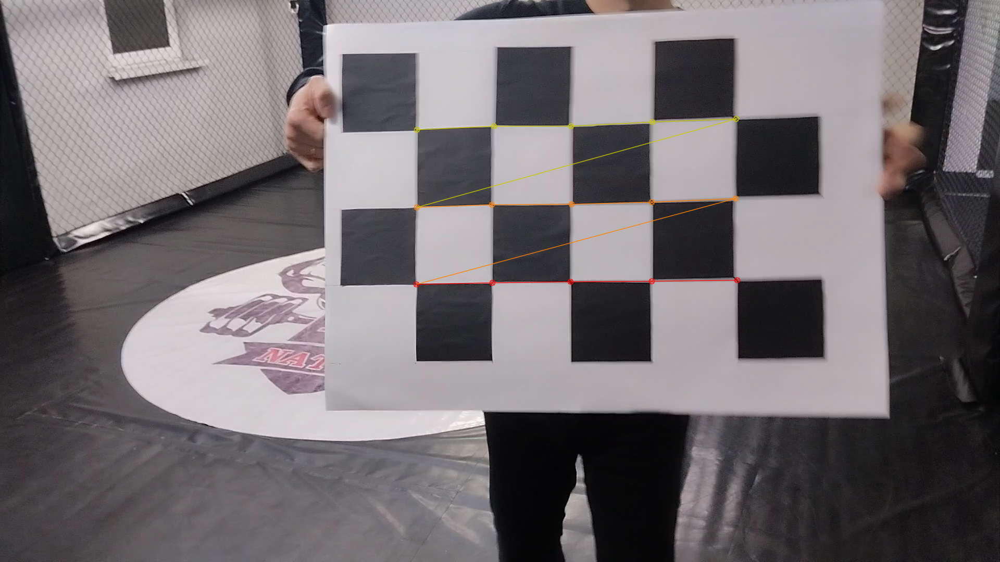

Для 5x4: False
Углы шахматной доски 5x4 не найдены.
Для 5x5: False
Углы шахматной доски 5x5 не найдены.
Для 5x6: False
Углы шахматной доски 5x6 не найдены.
Для 5x7: False
Углы шахматной доски 5x7 не найдены.
Для 6x3: False
Углы шахматной доски 6x3 не найдены.
Для 6x4: False
Углы шахматной доски 6x4 не найдены.
Для 6x5: False
Углы шахматной доски 6x5 не найдены.
Для 6x6: False
Углы шахматной доски 6x6 не найдены.
Для 6x7: False
Углы шахматной доски 6x7 не найдены.
Для 7x3: False
Углы шахматной доски 7x3 не найдены.
Для 7x4: False
Углы шахматной доски 7x4 не найдены.
Для 7x5: False
Углы шахматной доски 7x5 не найдены.
Для 7x6: False
Углы шахматной доски 7x6 не найдены.
Для 7x7: False
Углы шахматной доски 7x7 не найдены.


In [ ]:
#@title Переберем количество шашечек

import numpy as np
import cv2 as cv
import glob
from google.colab.patches import cv2_imshow

# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Arrays to store object points and image points from all the images.
objpoints = []  # 3d point in real world space
imgpoints = []  # 2d points in image plane.

images = glob.glob('/content/frame_0148.jpg')

# Перебор количества квадратов шахматной доски
for num_squares_x in range(3, 8):  # Пример: от 3 до 10 по горизонтали
    for num_squares_y in range(3, 8):  # Пример: от 3 до 10 по вертикали
        # prepare object points for the chessboard
        objp = np.zeros((num_squares_x * num_squares_y, 3), np.float32)
        objp[:, :2] = np.mgrid[0:num_squares_x, 0:num_squares_y].T.reshape(-1, 2)

        for fname in images:
            img = cv.imread(fname)
            if img is None:
                print(f"Не удалось загрузить изображение: {fname}")
                continue

            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

            # Apply Gaussian blur to reduce noise
            gray = cv.GaussianBlur(gray, (5, 5), 0)

            # Find the chess board corners
            ret, corners = cv.findChessboardCorners(gray, (num_squares_x, num_squares_y), None)

            print(f"Для {num_squares_x}x{num_squares_y}: {ret}")

            # If found, add object points, image points (after refining them)
            if ret:
                objpoints.append(objp)

                corners2 = cv.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
                imgpoints.append(corners2)

                # Draw and display the corners
                cv.drawChessboardCorners(img, (num_squares_x, num_squares_y), corners2, ret)
                cv2_imshow(img)
            else:
                print(f"Углы шахматной доски {num_squares_x}x{num_squares_y} не найдены.")

In [ ]:
import numpy as np
import cv2 as cv
import glob
import pandas as pd
from google.colab.patches import cv2_imshow

# Папка с изображениями
image_folder = '/content/drive/My Drive/image/cam1/*'
images = glob.glob(image_folder)

# Проверка количества изображений
print(f"Найдено изображений: {len(images)}")

# Создаем список для хранения результатов
results = []

# Перебор количества квадратов шахматной доски
for num_squares_x in range(3, 8):
    for num_squares_y in range(3, 8):
        for fname in images:
            img = cv.imread(fname)
            if img is None:
                print(f"Не удалось загрузить изображение: {fname}")
                continue

            gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
            gray = cv.GaussianBlur(gray, (5, 5), 0)

            ret, corners = cv.findChessboardCorners(gray, (num_squares_x, num_squares_y), None)

            # Сохраняем результаты
            results.append({
                'image': fname,
                'num_squares_x': num_squares_x,
                'num_squares_y': num_squares_y,
                'found': ret
            })

            if ret:
                print(f"Найдена шахматная доска в изображении: {fname} с размерами {num_squares_x}x{num_squares_y}")
            #else:
                #print(f"Шахматная доска не найдена в изображении: {fname} с размерами {num_squares_x}x{num_squares_y}")

# Создаем DataFrame из результатов
df = pd.DataFrame(results)

# Проверка размера DataFrame и его столбцов
print(f"Размер DataFrame: {df.shape}")
print(f"Столбцы DataFrame: {df.columns.tolist()}")

# Фильтруем только те строки, где шахматная доска была найдена
if 'found' in df.columns:
    df_found = df[df['found'] == True]
else:
    print("Столбец 'found' не найден в DataFrame.")
    df_found = pd.DataFrame()  # Создаем пустой DataFrame

# Сохраняем DataFrame в CSV файл (по желанию)
df_found.to_csv('/content/drive/My Drive/image/chessboard_sizes.csv', index=False)

# Выводим DataFrame
print(df_found)

Найдено изображений: 178
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0010.jpg с размерами 3x3
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0011.jpg с размерами 3x3
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0013.jpg с размерами 3x3
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0014.jpg с размерами 3x3
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0021.jpg с размерами 3x3
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0022.jpg с размерами 3x3
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0026.jpg с размерами 3x3
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0030.jpg с размерами 3x3
Найдена шахматная доска в изображении: /content/drive/My Drive/image/cam1/frame_0038.jpg с размерами 3x3
Найдена шахматная доска в изоб

In [ ]:
#@title Калибровка камеры
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [ ]:
ret

1.4745495002930522

In [ ]:
mtx

array([[3.51731785e+03, 0.00000000e+00, 1.07859187e+03],
       [0.00000000e+00, 3.52610842e+03, 6.10462046e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [ ]:
dist

array([[-1.90008761e+00,  3.23111178e+02,  8.61115034e-03,
         1.39176511e-01, -1.03458912e+04]])

In [ ]:
rvecs

(array([[-0.07818252],
        [-0.13467196],
        [-1.57829951]]),)

In [ ]:
tvecs

(array([[-1.88819553],
        [-0.43355948],
        [22.86943681]]),)

Функция `cv.calibrateCamera` из библиотеки OpenCV используется для калибровки камеры на основе набора изображений с известными объектами (например, шахматными досками). Она возвращает несколько значений, которые можно интерпретировать следующим образом:

1. **ret**: Это значение, которое указывает на успешность калибровки. Если `ret` равно `True`, это означает, что калибровка прошла успешно. Если `False`, то калибровка не удалась.

2. **mtx**: Это матрица камеры (или матрица внутренней калибровки), которая содержит параметры, такие как фокусное расстояние и координаты главной точки. Она имеет следующий вид:
   ```
   [[fx, 0, cx],
    [0, fy, cy],
    [0, 0, 1]]
   ```
   где `fx` и `fy` — фокусные расстояния по осям x и y, а `cx` и `cy` — координаты главной точки.

3. **dist**: Это вектор коэффициентов искажений, который описывает искажения, возникающие в изображениях из-за оптики камеры. Обычно он содержит 5 или 8 значений, которые могут включать радиальные и тангенциальные искажения.

4. **rvecs**: Это список векторов вращения для каждой из использованных позиций камеры. Каждый вектор описывает ориентацию камеры относительно объекта.

5. **tvecs**: Это список векторов трансляции для каждой из использованных позиций камеры. Каждый вектор описывает положение камеры относительно объекта.


In [ ]:
#@title Calib_scene.toml
 [int_cam01_img]
name = "int_cam01_img"
size = [ 1920.0, 1080.0]
matrix = [ [ 1681.4800554297299, 0.0, 1079.526150581583], [ 0.0, 1681.1798871241338, 561.8535505964554], [ 0.0, 0.0, 1.0]]
distortions = [ 0.11871345791167927, -0.12904201816310118, 0.008572243019737254, 0.022983974010761306]
rotation = [ 1.7355732998665603, -1.045548549195602, 0.7185752396991028]
translation = [ -0.3569765172180109, -0.14623138108461373, 3.844926052852434]
fisheye = false

[int_cam02_img]
name = "int_cam02_img"
size = [ 1920.0, 1080.0]
matrix = [ [ 1357.1091242606376, 0.0, 1014.6146723029143], [ 0.0, 1365.6617425323743, 417.3166529850645], [ 0.0, 0.0, 1.0]]
distortions = [ -0.046581208673491165, 0.1799505656025353, -0.013376504734406831, -0.003858256152117081]
rotation = [ 0.824164475560074, -1.88479468286161, 1.5326109967871941]
translation = [ -0.15060408554088406, 0.7488428790506589, 4.197020612652304]
fisheye = false

[int_cam03_img]
name = "int_cam03_img"
size = [ 1920.0, 1080.0]
matrix = [ [ 1553.799111745597, 0.0, 1024.4489719144408], [ 0.0, 1566.4269166646343, 545.0585928342167], [ 0.0, 0.0, 1.0]]
distortions = [ 0.03427994270581635, -0.09814125387087526, -0.004147252763326714, 0.014083245770049735]
rotation = [ 1.2796732646676656, 1.6796934644268853, -1.2246749130148402]
translation = [ -0.5337570816699324, 0.09952826333024332, 3.132185679588831]
fisheye = false

[int_cam04_img]
name = "int_cam04_img"
size = [ 2224.0, 1080.0]
matrix = [ [ 1808.790410181894, 0.0, 1046.5005611056358], [ 0.0, 1792.844707460016, 554.2213031104268], [ 0.0, 0.0, 1.0]]
distortions = [ 0.3032400474246887, -0.941735625558982, -0.013548735087077745, -0.007918347785311142]
rotation = [ 1.681812574058123, 0.8240850298224706, -0.698854282084051]
translation = [ 0.006303339714711713, 0.3175441449885352, 3.57918615030907]
fisheye = false

[metadata]
adjusted = false
error = 0.0


3. **matrix**:
   ```
   [
       [1681.4800554297299, 0.0, 1079.526150581583],
       [0.0, 1681.1798871241338, 561.8535505964554],
       [0.0, 0.0, 1.0]
   ]
   ```
   Это матрица камеры (или матрица внутренней калибровки), которая описывает параметры камеры, такие как фокусное расстояние и координаты главной точки (оптического центра).
   - Первые два значения в первой и второй строках представляют собой фокусные расстояния по осям x и y.
   - Третье значение в первой строке - это x-координата главной точки, а во второй строке - y-координата главной точки.

4. **distortions**: `[0.11871345791167927, -0.12904201816310118, 0.008572243019737254, 0.022983974010761306]` - это коэффициенты искажения, которые используются для коррекции искажений изображения, вызванных оптикой камеры. Обычно это параметры для радиального и тангенциального искажений.

5. **rotation**: `[1.7355732998665603, -1.045548549195602, 0.7185752396991028]` - это углы поворота камеры в радианах по трем осям (обычно это углы Эйлера). Они описывают ориентацию камеры в пространстве.

6. **translation**: `[-0.3569765172180109, -0.14623138108461373, 3.844926052852434]` - это вектор смещения камеры в трехмерном пространстве, который указывает, где находится камера относительно некоторой системы координат.

7. **fisheye**: `false` - это булевый параметр, указывающий, что камера не является рыбий глаз (fisheye) камерой, которая обычно имеет сильные искажения.